# Unrolled Optimization with Deep Priors (ODP) for Image Denoising

This notebook implements the core idea from the paper **"Unrolled Optimization with Deep Priors"** applied to **image denoising**.

## Overview

We solve the inverse problem of recovering a clean image $x$ from a noisy observation $y$:

$$y = x + \epsilon$$

where $\epsilon$ is Gaussian noise.

## Mathematical Framework

**Optimization Problem:**
$$\min_x \frac{1}{2}\|x - y\|_2^2 + R(x)$$

**Proximal Gradient Iteration:**
$$x_{k+1} = x_k - \alpha \nabla_x \frac{1}{2}\|x_k - y\|_2^2 - z_k$$

where $z_k = \text{CNN}_k(x_k)$ is a learned prior that replaces the classical proximal operator.

**Simplified:**
$$x_{k+1} = x_k - \alpha (x_k - y) - \text{CNN}_k(x_k)$$

## 1. Imports and Setup

In [3]:

import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
import os
import glob

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# Use CPU by default (simple and works everywhere)
device = torch.device('cpu')
print(f"Using device: {device}")

# Helper function to compute PSNR
def compute_psnr(clean, reconstructed):
    """
    Compute Peak Signal-to-Noise Ratio (PSNR) between two images.
    
    Args:
        clean: Ground truth image (numpy array, values in [0, 1])
        reconstructed: Reconstructed image (numpy array, values in [0, 1])
    
    Returns:
        PSNR value in dB
    """
    mse = np.mean((clean - reconstructed) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 1.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr


Using device: cpu


## 2. Data Loading and Preprocessing

We load RGB images from a folder:
- Convert BGR (OpenCV format) to RGB
- Normalize pixel values to [0, 1]
- Handle variable image sizes by processing images one by one
- Add synthetic Gaussian noise to create noisy observations

In [ ]:

def load_image(path):
    """
    Load a single RGB image from disk.
    
    Args:
        path: Path to the image file
    
    Returns:
        RGB image as numpy array with values in [0, 1]
    """
    # OpenCV loads images in BGR format
    img_bgr = cv2.imread(path)
    
    if img_bgr is None:
        raise ValueError(f"Could not load image: {path}")
    
    # Convert BGR to RGB
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # Normalize to [0, 1]
    img_normalized = img_rgb.astype(np.float32) / 255.0
    
    return img_normalized


def add_gaussian_noise(image, noise_level=0.1):
    """
    Add Gaussian noise to an image.
    
    Args:
        image: Clean image (numpy array, values in [0, 1])
        noise_level: Standard deviation of the Gaussian noise
    
    Returns:
        Noisy image (clipped to [0, 1])
    """
    # Generate Gaussian noise with same shape as image
    noise = np.random.randn(*image.shape).astype(np.float32) * noise_level
    
    # Add noise and clip to valid range
    noisy_image = image + noise
    noisy_image = np.clip(noisy_image, 0, 1)
    
    return noisy_image


def load_dataset(folder_path, max_images=None):
    """
    Load all images from a folder.
    
    Args:
        folder_path: Path to folder containing images
        max_images: Maximum number of images to load (None = all)
    
    Returns:
        List of RGB images (numpy arrays)
    """
    # Find all image files
    extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
    image_paths = []
    for ext in extensions:
        image_paths.extend(glob.glob(os.path.join(folder_path, ext)))
    
    if max_images is not None:
        image_paths = image_paths[:max_images]
    
    # Load images
    images = []
    for path in image_paths:
        try:
            img = load_image(path)
            images.append(img)
            print(f"Loaded: {os.path.basename(path)} - Shape: {img.shape}")
        except Exception as e:
            print(f"Error loading {path}: {e}")
    
    return images


# Load training and test images

train_images = load_dataset("data/train", max_images=56)

test_images = load_dataset("data/test", max_images=15)

print(f"\nTotal training images: {len(train_images)}")
print(f"Total test images: {len(test_images)}")

Loading training images...
Loaded: 101085.jpg - Shape: (481, 321, 3)
Loaded: 101087.jpg - Shape: (481, 321, 3)
Loaded: 102061.jpg - Shape: (481, 321, 3)


Loaded: 103070.jpg - Shape: (321, 481, 3)
Loaded: 105025.jpg - Shape: (321, 481, 3)
Loaded: 106024.jpg - Shape: (321, 481, 3)
Loaded: 108005.jpg - Shape: (321, 481, 3)
Loaded: 108070.jpg - Shape: (321, 481, 3)
Loaded: 108082.jpg - Shape: (321, 481, 3)
Loaded: 109053.jpg - Shape: (321, 481, 3)
Loaded: 119082.jpg - Shape: (321, 481, 3)
Loaded: 12084.jpg - Shape: (321, 481, 3)
Loaded: 123074.jpg - Shape: (321, 481, 3)
Loaded: 126007.jpg - Shape: (321, 481, 3)
Loaded: 130026.jpg - Shape: (321, 481, 3)
Loaded: 134035.jpg - Shape: (321, 481, 3)
Loaded: 14037.jpg - Shape: (321, 481, 3)
Loaded: 143090.jpg - Shape: (321, 481, 3)
Loaded: 145086.jpg - Shape: (321, 481, 3)
Loaded: 147091.jpg - Shape: (321, 481, 3)
Loaded: 148026.jpg - Shape: (481, 321, 3)
Loaded: 148089.jpg - Shape: (321, 481, 3)
Loaded: 157055.jpg - Shape: (321, 481, 3)
Loaded: 159008.jpg - Shape: (321, 481, 3)
Loaded: 160068.jpg - Shape: (321, 481, 3)
Loaded: 16077.jpg - Shape: (321, 481, 3)
Loaded: 163085.jpg - Shape: (321, 481

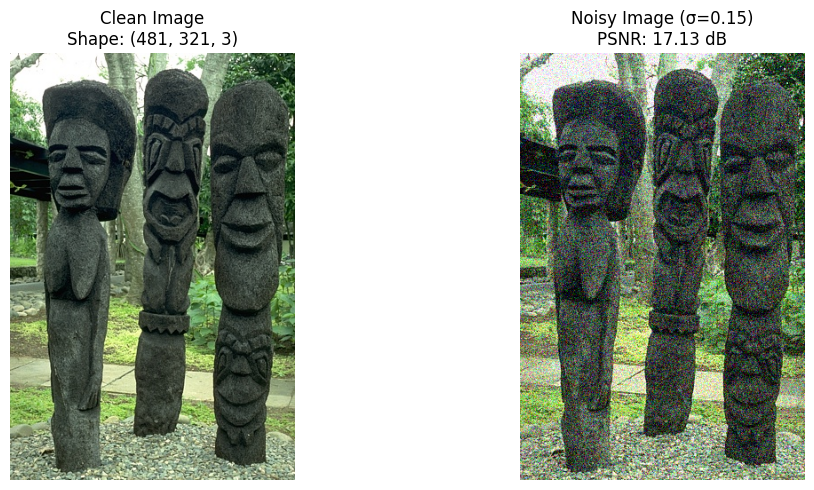

In [4]:
# Visualize a sample image and its noisy version
noise_level = 0.15  # Standard deviation of noise

# Take the first training image as example
sample_image = train_images[0]
sample_noisy = add_gaussian_noise(sample_image, noise_level)

# Display
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(sample_image)
axes[0].set_title(f"Clean Image\nShape: {sample_image.shape}")
axes[0].axis('off')

axes[1].imshow(sample_noisy)
psnr_noisy = compute_psnr(sample_image, sample_noisy)
axes[1].set_title(f"Noisy Image (σ={noise_level})\nPSNR: {psnr_noisy:.2f} dB")
axes[1].axis('off')

plt.tight_layout()
plt.show()

## 3. Forward Model (Identity Operator)

For denoising, the forward operator $A$ is the **identity**:
- Forward: $A(x) = x$
- Adjoint: $A^T(x) = x$

The observation model is: $y = A(x) + \epsilon = x + \epsilon$

In [4]:

class IdentityOperator:
    """
    Identity operator for image denoising.
    
    Forward model: y = A(x) + noise = x + noise
    
    For denoising:
        - A(x) = x (identity)
        - A^T(y) = y (identity)
    """
    
    def forward(self, x):
        """
        Apply forward operator: A(x) = x
        
        Args:
            x: Input image (torch tensor or numpy array)
        
        Returns:
            Same as input (identity)
        """
        return x
    
    def adjoint(self, y):
        """
        Apply adjoint operator: A^T(y) = y
        
        Args:
            y: Input (torch tensor or numpy array)
        
        Returns:
            Same as input (identity)
        """
        return y
    
    def gradient(self, x, y):
        """
        Compute gradient of data fidelity term: ∇_x (1/2)||A(x) - y||^2
        
        For identity operator:
            ∇_x (1/2)||x - y||^2 = x - y
        
        Args:
            x: Current estimate
            y: Noisy observation
        
        Returns:
            Gradient: x - y
        """
        return x - y


# Create the forward operator
forward_op = IdentityOperator()

# Test the operator
print("Testing Identity Operator:")
test_tensor = torch.randn(1, 3, 64, 64)
print(f"Input shape: {test_tensor.shape}")
print(f"Forward output shape: {forward_op.forward(test_tensor).shape}")
print(f"Adjoint output shape: {forward_op.adjoint(test_tensor).shape}")


Testing Identity Operator:
Input shape: torch.Size([1, 3, 64, 64])
Forward output shape: torch.Size([1, 3, 64, 64])
Adjoint output shape: torch.Size([1, 3, 64, 64])


## 4. Classical Denoising Baseline

We implement two classical denoising methods using OpenCV:
1. **Gaussian blur**: Simple smoothing filter
2. **Median filter**: Non-linear filter, good for salt-and-pepper noise

These methods will serve as baselines to compare against ODP.

Classical Denoising Results:
  Noisy image PSNR:    17.13 dB
  Gaussian blur PSNR:  22.41 dB
  Median filter PSNR:  21.14 dB


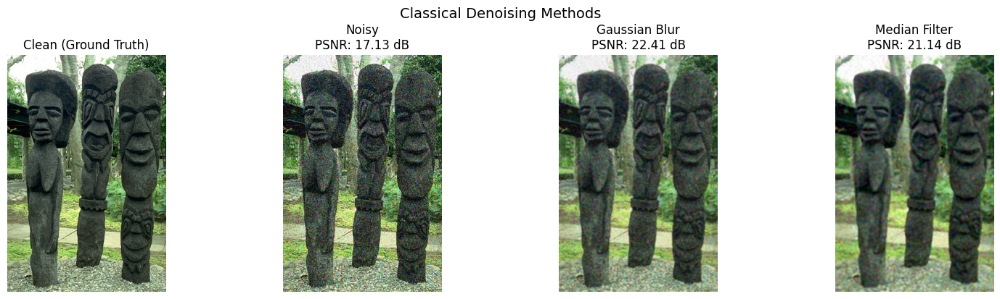

In [6]:

def gaussian_denoise(noisy_image, kernel_size=5):
    """
    Denoise image using Gaussian blur.
    
    Args:
        noisy_image: Noisy RGB image (numpy array, values in [0, 1])
        kernel_size: Size of the Gaussian kernel (odd number)
    
    Returns:
        Denoised image (same size and format as input)
    """
    # cv2.GaussianBlur expects uint8 or float32
    # sigma=0 means it's computed from kernel size
    denoised = cv2.GaussianBlur(noisy_image, (kernel_size, kernel_size), 0)
    return denoised


def median_denoise(noisy_image, kernel_size=5):
    """
    Denoise image using median filter.
    
    Args:
        noisy_image: Noisy RGB image (numpy array, values in [0, 1])
        kernel_size: Size of the median filter kernel (odd number)
    
    Returns:
        Denoised image (same size and format as input)
    """
    # Convert to uint8 for cv2.medianBlur (required format)
    img_uint8 = (noisy_image * 255).astype(np.uint8)
    denoised_uint8 = cv2.medianBlur(img_uint8, kernel_size)
    # Convert back to float32 [0, 1]
    denoised = denoised_uint8.astype(np.float32) / 255.0
    return denoised


# Test classical methods on sample image
denoised_gaussian = gaussian_denoise(sample_noisy, kernel_size=5)
denoised_median = median_denoise(sample_noisy, kernel_size=5)

# Compute PSNR
psnr_gaussian = compute_psnr(sample_image, denoised_gaussian)
psnr_median = compute_psnr(sample_image, denoised_median)

print("Classical Denoising Results:")
print(f"  Noisy image PSNR:    {psnr_noisy:.2f} dB")
print(f"  Gaussian blur PSNR:  {psnr_gaussian:.2f} dB")
print(f"  Median filter PSNR:  {psnr_median:.2f} dB")

# Visualization
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(sample_image)
axes[0].set_title("Clean (Ground Truth)")
axes[0].axis('off')

axes[1].imshow(sample_noisy)
axes[1].set_title(f"Noisy\nPSNR: {psnr_noisy:.2f} dB")
axes[1].axis('off')

axes[2].imshow(denoised_gaussian)
axes[2].set_title(f"Gaussian Blur\nPSNR: {psnr_gaussian:.2f} dB")
axes[2].axis('off')

axes[3].imshow(denoised_median)
axes[3].set_title(f"Median Filter\nPSNR: {psnr_median:.2f} dB")
axes[3].axis('off')

plt.tight_layout()
plt.suptitle("Classical Denoising Methods", y=1.02, fontsize=14)
plt.show()

## 5. CNN Prior (Deep Prior)

We implement a small residual CNN that learns a data-driven prior:
- **Architecture**: 10 convolutional layers with ReLU activations
- **Input/Output**: Same size (padding='same')
- **Channels**: RGB (3 channels) → 64 features → RGB (3 channels)
- **Residual connection**: output = input + CNN(input)

The CNN learns to predict the "correction" needed to improve the image.

In [7]:


class CNNPrior(nn.Module):
    """
    Small residual CNN that acts as a learned prior.
    
    Architecture:
        Conv -> ReLU -> Conv -> ReLU -> Conv -> ReLU -> Conv -> ReLU -> Conv
        
    Input: RGB image (B, 3, H, W)
    Output: Correction term (B, 3, H, W)
    
    The final output is: x + CNN(x) (residual connection)
    """
    
    def __init__(self, in_channels=3, hidden_channels=64):
        """
        Initialize the CNN prior.
        
        Args:
            in_channels: Number of input channels (3 for RGB)
            hidden_channels: Number of hidden feature channels
        """
        super(CNNPrior, self).__init__()
        
        # Layer 1: Input -> Hidden features
        self.conv1 = nn.Conv2d(in_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        
        # Layer 2: Hidden -> Hidden
        self.conv2 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        
        # Layer 3: Hidden -> Hidden
        self.conv3 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu3 = nn.ReLU()
        
        # Layer 4: Hidden -> Hidden
        self.conv4 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu4 = nn.ReLU()
        
        # Layer 5: Hidden -> Output (correction term)
        self.conv5 = nn.Conv2d(hidden_channels, in_channels, kernel_size=3, padding=1)
        
        # Initialize weights (small values for stability)
        self._init_weights()
    
    def _init_weights(self):
        """Initialize weights with small values."""
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        """
        Forward pass: compute the correction term.
        
        Args:
            x: Input image tensor (B, 3, H, W)
        
        Returns:
            Correction term z = CNN(x) (same shape as input)
        """
        # Pass through CNN layers
        out = self.relu1(self.conv1(x))
        out = self.relu2(self.conv2(out))
        out = self.relu3(self.conv3(out))
        out = self.relu4(self.conv4(out))
        out = self.conv5(out)
        
        return out


# Test the CNN prior
test_cnn = CNNPrior(in_channels=3, hidden_channels=64).to(device)
test_input = torch.randn(1, 3, 64, 64).to(device)
test_output = test_cnn(test_input)

print("CNN Prior Architecture:")
print(f"  Input shape:  {test_input.shape}")
print(f"  Output shape: {test_output.shape}")
print(f"  Total parameters: {sum(p.numel() for p in test_cnn.parameters()):,}")

CNN Prior Architecture:
  Input shape:  torch.Size([1, 3, 64, 64])
  Output shape: torch.Size([1, 3, 64, 64])
  Total parameters: 114,307


## 6. Unrolled Optimization (ODP)

The ODP network **unrolls** the proximal gradient algorithm into a feed-forward network.

**Proximal Gradient Iteration:**
$$x_{k+1} = x_k - \alpha_k \cdot (x_k - y) - \text{CNN}_k(x_k)$$

Where:
- $x_k$: Current image estimate at iteration $k$
- $y$: Noisy observation
- $\alpha_k$: Step size (learnable parameter)
- $\text{CNN}_k$: Learned prior at iteration $k$



In [10]:

class ODPDenoising(nn.Module):
    """
    Unrolled Optimization with Deep Priors for Image Denoising.
    
    This network unrolls the proximal gradient algorithm:
        x_{k+1} = x_k - alpha_k * (x_k - y) - CNN_k(x_k)
    
    Where:
        - (x_k - y) is the gradient of the data fidelity term
        - CNN_k(x_k) is the learned prior at iteration k
        - alpha_k is a learnable step size
    """
    
    def __init__(self, num_iterations=5, hidden_channels=64):
        """
        Initialize the ODP network.
        
        Args:
            num_iterations: Number of unrolled iterations (K)
            hidden_channels: Number of hidden channels in CNN priors
        """
        super(ODPDenoising, self).__init__()
        
        self.num_iterations = num_iterations
        
        # Create a CNN prior for each iteration
        # Each iteration has its own CNN with separate weights
        self.cnn_priors = nn.ModuleList([
            CNNPrior(in_channels=3, hidden_channels=hidden_channels)
            for _ in range(num_iterations)
        ])
        
        # Learnable step sizes for each iteration
        # Initialize to small positive values
        self.alphas = nn.ParameterList([
            nn.Parameter(torch.tensor(0.1))
            for _ in range(num_iterations)
        ])
    
    def forward(self, y):
        """
        Forward pass: apply unrolled optimization.
        
        Algorithm:
            1. Initialize x_0 = y (start from noisy observation)
            2. For k = 0, 1, ..., K-1:
                   x_{k+1} = x_k - alpha_k * (x_k - y) - CNN_k(x_k)
            3. Return x_K
        
        Args:
            y: Noisy observation (B, 3, H, W)
        
        Returns:
            x_K: Denoised image (B, 3, H, W)
        """
        # Step 1: Initialize x_0 = y
        x = y.clone()
        
        # Step 2: Iterate through unrolled layers
        for k in range(self.num_iterations):
            # Get current step size (ensure positive)
            alpha_k = torch.abs(self.alphas[k])
            
            # Compute data fidelity gradient: (x_k - y)
            data_gradient = x - y
            
            # Compute CNN prior: z_k = CNN_k(x_k)
            z_k = self.cnn_priors[k](x)
            
            # Update step:
            # x_{k+1} = x_k - alpha_k * (x_k - y) - CNN_k(x_k)
            x = x - alpha_k * data_gradient - z_k
            
            # Clip to valid range [0, 1]
            x = torch.clamp(x, 0, 1)
        
        # Step 3: Return final estimate
        return x


# Create the ODP network
num_iterations = 5
odp_model = ODPDenoising(num_iterations=num_iterations, hidden_channels=64).to(device)

print("ODP Network Architecture:")
print(f"  Number of iterations: {num_iterations}")
print(f"  Total parameters: {sum(p.numel() for p in odp_model.parameters()):,}")
print(f"  Learnable step sizes: {[f'alpha_{k}' for k in range(num_iterations)]}")

ODP Network Architecture:
  Number of iterations: 5
  Total parameters: 571,540
  Learnable step sizes: ['alpha_0', 'alpha_1', 'alpha_2', 'alpha_3', 'alpha_4']


## 7. Training Loop

We train the ODP network using:
- **Loss function**: Mean Squared Error (MSE) between output and clean image
- **Optimizer**: Adam
- **Training data**: Pairs of (noisy, clean) images
- **Processing**: Images are processed one by one (no batching needed)

In [11]:


def numpy_to_tensor(image):
    """
    Convert numpy image (H, W, C) to PyTorch tensor (1, C, H, W).
    
    Args:
        image: Numpy array with shape (H, W, C) and values in [0, 1]
    
    Returns:
        PyTorch tensor with shape (1, C, H, W)
    """
    # Transpose from (H, W, C) to (C, H, W)
    tensor = torch.from_numpy(image).permute(2, 0, 1).float()
    # Add batch dimension: (C, H, W) -> (1, C, H, W)
    tensor = tensor.unsqueeze(0)
    return tensor


def tensor_to_numpy(tensor):
    """
    Convert PyTorch tensor (1, C, H, W) to numpy image (H, W, C).
    
    Args:
        tensor: PyTorch tensor with shape (1, C, H, W)
    
    Returns:
        Numpy array with shape (H, W, C) and values in [0, 1]
    """
    # Remove batch dimension and transpose
    image = tensor.squeeze(0).permute(1, 2, 0).detach().cpu().numpy()
    # Clip to valid range
    image = np.clip(image, 0, 1)
    return image


# Test conversion functions
test_np = train_images[0]
test_t = numpy_to_tensor(test_np)
test_back = tensor_to_numpy(test_t)

print(f"Original numpy shape: {test_np.shape}")
print(f"Tensor shape: {test_t.shape}")
print(f"Back to numpy shape: {test_back.shape}")
print(f"Conversion error: {np.max(np.abs(test_np - test_back)):.6f}")

Original numpy shape: (481, 321, 3)
Tensor shape: torch.Size([1, 3, 481, 321])
Back to numpy shape: (481, 321, 3)
Conversion error: 0.000000


In [66]:
def train_odp(model, train_images, num_epochs=10, noise_level=0.15, learning_rate=1e-4):
    """
    Train the ODP network on a set of images.
    
    Args:
        model: ODP network
        train_images: List of clean images (numpy arrays)
        num_epochs: Number of training epochs
        noise_level: Standard deviation of Gaussian noise
        learning_rate: Learning rate for Adam optimizer
    
    Returns:
        List of training losses per epoch
    """
    # Loss function: Mean Squared Error
    criterion = nn.MSELoss()
    
    # Optimizer: Adam
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # Training history
    losses = []
    
    print("Starting training...")
    print(f"  Number of images: {len(train_images)}")
    print(f"  Epochs: {num_epochs}")
    print(f"  Noise level: {noise_level}")
    print(f"  Learning rate: {learning_rate}")
    print("-" * 50)
    
    for epoch in range(num_epochs):
        epoch_loss = 0.0
        
        # Process each image independently
        for img_idx, clean_image in enumerate(train_images):
            # Create noisy version (fresh noise each time)
            noisy_image = add_gaussian_noise(clean_image, noise_level)
            
            # Convert to tensors
            y = numpy_to_tensor(noisy_image).to(device)  # Noisy input
            x_true = numpy_to_tensor(clean_image).to(device)  # Ground truth
            
            # Forward pass through ODP
            optimizer.zero_grad()
            x_pred = model(y)
            
            # Compute loss: MSE(predicted, ground_truth)
            loss = criterion(x_pred, x_true)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
        
        # Average loss for this epoch
        avg_loss = epoch_loss / len(train_images)
        losses.append(avg_loss)
        
        # Print progress every few epochs
        if (epoch + 1) % 2 == 0 or epoch == 0:
            # Get current step sizes
            alphas = [torch.abs(a).item() for a in model.alphas]
            print(f"Epoch [{epoch+1:3d}/{num_epochs}] - Loss: {avg_loss:.6f} - "
                  f"Alphas: [{', '.join(f'{a:.3f}' for a in alphas)}]")
    
    print("-" * 50)
    print("Training complete!")
    
    return losses


# Train the model
# Note: For educational purposes, we use few epochs

num_epochs = 20
noise_level = 0.15

losses = train_odp(
    model=odp_model,
    train_images=train_images,
    num_epochs=num_epochs,
    noise_level=noise_level,
    learning_rate=1e-4
)

Starting training...
  Number of images: 56
  Epochs: 20
  Noise level: 0.15
  Learning rate: 0.0001
--------------------------------------------------
Epoch [  1/20] - Loss: 0.021114 - Alphas: [0.100, 0.101, 0.101, 0.101, 0.102]
Epoch [  2/20] - Loss: 0.007001 - Alphas: [0.100, 0.101, 0.101, 0.101, 0.102]
Epoch [  4/20] - Loss: 0.004767 - Alphas: [0.100, 0.101, 0.101, 0.101, 0.102]
Epoch [  6/20] - Loss: 0.004074 - Alphas: [0.100, 0.101, 0.100, 0.100, 0.101]
Epoch [  8/20] - Loss: 0.003624 - Alphas: [0.100, 0.101, 0.100, 0.100, 0.101]
Epoch [ 10/20] - Loss: 0.003340 - Alphas: [0.100, 0.101, 0.100, 0.099, 0.100]
Epoch [ 12/20] - Loss: 0.003114 - Alphas: [0.100, 0.101, 0.099, 0.099, 0.099]
Epoch [ 14/20] - Loss: 0.002945 - Alphas: [0.100, 0.101, 0.099, 0.098, 0.098]
Epoch [ 16/20] - Loss: 0.002795 - Alphas: [0.100, 0.101, 0.099, 0.098, 0.097]
Epoch [ 18/20] - Loss: 0.002670 - Alphas: [0.100, 0.101, 0.099, 0.097, 0.096]
Epoch [ 20/20] - Loss: 0.002585 - Alphas: [0.100, 0.101, 0.098, 0.09

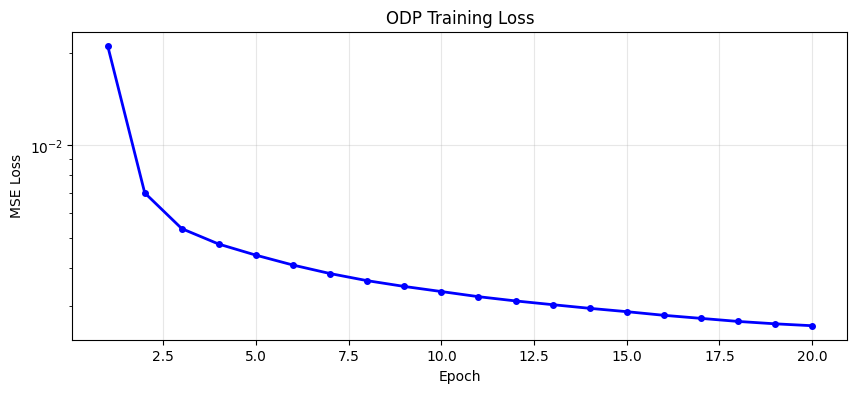


Learned step sizes (alphas):
  Iteration 1: alpha_0 = 0.1000
  Iteration 2: alpha_1 = 0.1014
  Iteration 3: alpha_2 = 0.0983
  Iteration 4: alpha_3 = 0.0971
  Iteration 5: alpha_4 = 0.0948


In [67]:
# Plot training loss
plt.figure(figsize=(10, 4))
plt.plot(range(1, len(losses) + 1), losses, 'b-o', linewidth=2, markersize=4)
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('ODP Training Loss')
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.show()

# Print final learned step sizes
print("\nLearned step sizes (alphas):")
for k, alpha in enumerate(odp_model.alphas):
    print(f"  Iteration {k+1}: alpha_{k} = {torch.abs(alpha).item():.4f}")

## 8. Evaluation

We evaluate the trained ODP model on **test images** (not used during training).

Comparison:
1. **Noisy image**: Input observation
2. **Classical denoising**: Gaussian blur baseline
3. **ODP reconstruction**: Our learned method
4. **Ground truth**: Clean original image

Metric: Peak Signal-to-Noise Ratio (PSNR) in dB

In [14]:


def evaluate_denoising(model, test_images, noise_level=0.1):
    """
    Evaluate denoising methods on test images.
    
    Args:
        model: Trained ODP model
        test_images: List of clean test images
        noise_level: Standard deviation of noise
    
    Returns:
        Dictionary with results for each image
    """
    model.eval()  # Set model to evaluation mode
    
    results = []
    
    with torch.no_grad():  # No gradients needed for evaluation
        for idx, clean_image in enumerate(test_images):
            print(f"\nEvaluating image {idx + 1}/{len(test_images)} - Shape: {clean_image.shape}")
            
            # Create noisy version
            noisy_image = add_gaussian_noise(clean_image, noise_level)
            
            # Classical denoising (Gaussian blur)
            classical_result = gaussian_denoise(noisy_image, kernel_size=5)
            
            # ODP denoising
            y_tensor = numpy_to_tensor(noisy_image).to(device)
            odp_result_tensor = model(y_tensor)
            odp_result = tensor_to_numpy(odp_result_tensor)
            
            # Compute PSNR values
            psnr_noisy = compute_psnr(clean_image, noisy_image)
            psnr_classical = compute_psnr(clean_image, classical_result)
            psnr_odp = compute_psnr(clean_image, odp_result)
            
            # Store results
            results.append({
                'clean': clean_image,
                'noisy': noisy_image,
                'classical': classical_result,
                'odp': odp_result,
                'psnr_noisy': psnr_noisy,
                'psnr_classical': psnr_classical,
                'psnr_odp': psnr_odp,
                'shape': clean_image.shape
            })
            
            print(f"  PSNR Noisy:     {psnr_noisy:.2f} dB")
            print(f"  PSNR Classical: {psnr_classical:.2f} dB")
            print(f"  PSNR ODP:       {psnr_odp:.2f} dB")
            print(f"  Improvement:    +{psnr_odp - psnr_noisy:.2f} dB over noisy")
    
    return results


# Evaluate on test images
results = evaluate_denoising(odp_model, test_images, noise_level=noise_level)


Evaluating image 1/15 - Shape: (321, 481, 3)
  PSNR Noisy:     16.71 dB
  PSNR Classical: 26.68 dB
  PSNR ODP:       26.57 dB
  Improvement:    +9.86 dB over noisy

Evaluating image 2/15 - Shape: (481, 321, 3)
  PSNR Noisy:     16.86 dB
  PSNR Classical: 24.78 dB
  PSNR ODP:       25.91 dB
  Improvement:    +9.05 dB over noisy

Evaluating image 3/15 - Shape: (481, 321, 3)
  PSNR Noisy:     17.01 dB
  PSNR Classical: 23.49 dB
  PSNR ODP:       25.26 dB
  Improvement:    +8.25 dB over noisy

Evaluating image 4/15 - Shape: (321, 481, 3)
  PSNR Noisy:     16.86 dB
  PSNR Classical: 20.60 dB
  PSNR ODP:       21.85 dB
  Improvement:    +4.99 dB over noisy

Evaluating image 5/15 - Shape: (321, 481, 3)
  PSNR Noisy:     17.03 dB
  PSNR Classical: 24.81 dB
  PSNR ODP:       25.35 dB
  Improvement:    +8.32 dB over noisy

Evaluating image 6/15 - Shape: (321, 481, 3)
  PSNR Noisy:     16.59 dB
  PSNR Classical: 26.52 dB
  PSNR ODP:       27.01 dB
  Improvement:    +10.42 dB over noisy

Evaluati

In [15]:
# Summary statistics

avg_psnr_noisy = np.mean([r['psnr_noisy'] for r in results])
avg_psnr_classical = np.mean([r['psnr_classical'] for r in results])
avg_psnr_odp = np.mean([r['psnr_odp'] for r in results])

print(f"\nAverage PSNR across {len(results)} test images:")
print(f"  Noisy:     {avg_psnr_noisy:.2f} dB")
print(f"  Classical: {avg_psnr_classical:.2f} dB (Gaussian blur)")
print(f"  ODP:       {avg_psnr_odp:.2f} dB")
print(f"\nODP improvement over classical: +{avg_psnr_odp - avg_psnr_classical:.2f} dB")


Average PSNR across 15 test images:
  Noisy:     17.05 dB
  Classical: 24.55 dB (Gaussian blur)
  ODP:       25.91 dB

ODP improvement over classical: +1.36 dB


In [98]:
#Save model
model_path = "odp_denoising_model.pth"
torch.save(odp_model.state_dict(), model_path)

In [13]:

#load model
model_path = "odp_denoising_model.pth"
odp_model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

## 9. Visualization

We display the results side by side for each test image:
- **Clean**: Ground truth image
- **Noisy**: Observation with added Gaussian noise
- **Classical**: Gaussian blur denoising result
- **ODP**: Our unrolled optimization result


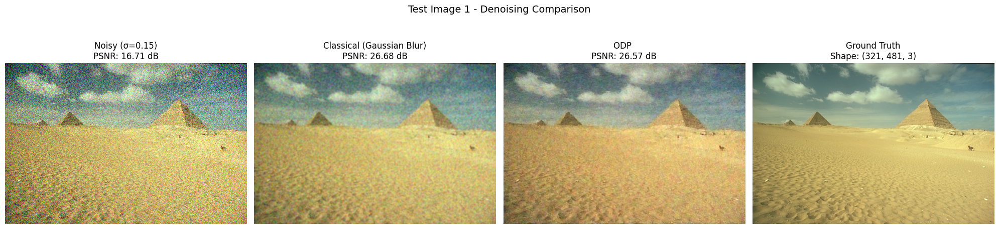

In [77]:

def visualize_results(results, noise_level = 0.15, num_images=1):
    """
    Display denoising results for all test images.
    
    Args:
        results: List of result dictionaries from evaluate_denoising
    """
    for idx, r in enumerate(results[:num_images]):
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        # Noisy image
        axes[0].imshow(r['noisy'])
        axes[0].set_title(f"Noisy (σ={noise_level})\nPSNR: {r['psnr_noisy']:.2f} dB")
        axes[0].axis('off')
        
        # Classical result
        axes[1].imshow(r['classical'])
        axes[1].set_title(f"Classical (Gaussian Blur)\nPSNR: {r['psnr_classical']:.2f} dB")
        axes[1].axis('off')
        
        # ODP result
        axes[2].imshow(r['odp'])
        axes[2].set_title(f"ODP \nPSNR: {r['psnr_odp']:.2f} dB")
        axes[2].axis('off')
        
        # Clean image
        axes[3].imshow(r['clean'])
        axes[3].set_title(f"Ground Truth\nShape: {r['shape']}")
        axes[3].axis('off')
        
        plt.suptitle(f"Test Image {idx + 1} - Denoising Comparison", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()


# Visualize all test results
visualize_results(results)

In [ ]:
# Group results by image size and visualize results on same plots
from collections import defaultdict
def visualize_grouped_results(results, noise_level = 0.15):
    """
    Display denoising results grouped by image size.
    
    Args:
        results: List of result dictionaries from evaluate_denoising
    """
    grouped_results = defaultdict(list)
    
    # Group results by image shape
    for r in results:
        shape_key = r['shape']
        grouped_results[shape_key].append(r)
    
    # Visualize each group
    for shape, group in grouped_results.items():
        num_images = len(group)
        if shape == (321, 481, 3):
            
            fig, axes = plt.subplots(num_images, 4, figsize=(18, 3 * num_images))
        else :
            fig, axes = plt.subplots(num_images, 4, figsize=(9, 3 * num_images))
        for idx, r in enumerate(group):
            ax_row = axes[idx] if num_images > 1 else axes
            
            # Noisy image
            ax_row[0].imshow(r['noisy'])
            if idx == 0:
                ax_row[0].set_title(f"Noisy (σ={noise_level})")
            ax_row[0].axis('off')
            
            # Classical result
            ax_row[1].imshow(r['classical'])
            if idx == 0:
                ax_row[1].set_title(f"Classical (Gaussian Blur)")
            ax_row[1].axis('off')
            
            # ODP result
            ax_row[2].imshow(r['odp'])
            if idx == 0:
                ax_row[2].set_title(f"ODP ")
            ax_row[2].axis('off')
            
            # Clean image
            ax_row[3].imshow(r['clean'])
            if idx == 0:
                ax_row[3].set_title(f"Ground Truth")
            ax_row[3].axis('off')
        
        plt.suptitle(f"Denoising Results for Image Size: {shape}", fontsize=16, y=1.02)
        plt.tight_layout()
        plt.subplots_adjust(wspace=0.002, hspace=0.02)
        plt.show()

visualize_grouped_results(results)

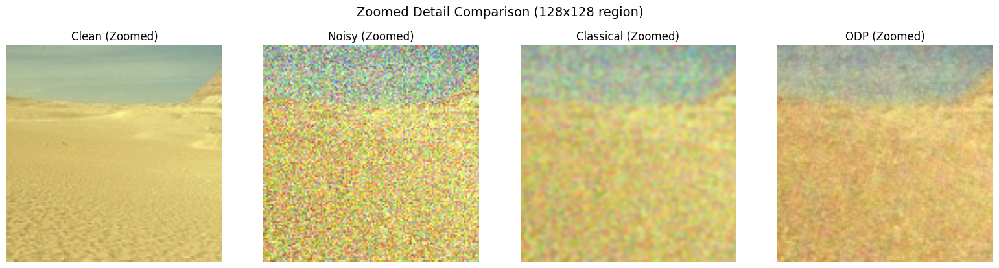

In [71]:

def visualize_zoom(results, crop_size=100):
    """
    Display zoomed-in regions to see fine details.
    
    Args:
        results: List of result dictionaries
        crop_size: Size of the cropped region
    """
    if len(results) == 0:
        print("No results to display")
        return
    
    # Use the first test image
    r = results[0]
    
    # Get image dimensions
    h, w = r['clean'].shape[:2]
    
    # Crop from center
    y_start = max(0, (h - crop_size) // 2)
    x_start = max(0, (w - crop_size) // 2)
    y_end = min(h, y_start + crop_size)
    x_end = min(w, x_start + crop_size)
    
    # Extract crops
    clean_crop = r['clean'][y_start:y_end, x_start:x_end]
    noisy_crop = r['noisy'][y_start:y_end, x_start:x_end]
    classical_crop = r['classical'][y_start:y_end, x_start:x_end]
    odp_crop = r['odp'][y_start:y_end, x_start:x_end]
    
    # Display zoomed comparison
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    
    axes[0].imshow(clean_crop)
    axes[0].set_title("Clean (Zoomed)")
    axes[0].axis('off')
    
    axes[1].imshow(noisy_crop)
    axes[1].set_title("Noisy (Zoomed)")
    axes[1].axis('off')
    
    axes[2].imshow(classical_crop)
    axes[2].set_title("Classical (Zoomed)")
    axes[2].axis('off')
    
    axes[3].imshow(odp_crop)
    axes[3].set_title("ODP (Zoomed)")
    axes[3].axis('off')
    
    plt.suptitle(f"Zoomed Detail Comparison ({crop_size}x{crop_size} region)", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()


# Show zoomed comparison
visualize_zoom(results, crop_size=128)

# Testing different noise level

In [32]:
results_noisy = evaluate_denoising(odp_model, test_images, noise_level=0.20)


Evaluating image 1/15 - Shape: (321, 481, 3)
  PSNR Noisy:     14.46 dB
  PSNR Classical: 24.77 dB
  PSNR ODP:       24.62 dB
  Improvement:    +10.16 dB over noisy

Evaluating image 2/15 - Shape: (481, 321, 3)
  PSNR Noisy:     14.65 dB
  PSNR Classical: 23.37 dB
  PSNR ODP:       24.19 dB
  Improvement:    +9.54 dB over noisy

Evaluating image 3/15 - Shape: (481, 321, 3)
  PSNR Noisy:     14.89 dB
  PSNR Classical: 22.41 dB
  PSNR ODP:       23.89 dB
  Improvement:    +9.00 dB over noisy

Evaluating image 4/15 - Shape: (321, 481, 3)
  PSNR Noisy:     14.62 dB
  PSNR Classical: 19.99 dB
  PSNR ODP:       20.91 dB
  Improvement:    +6.29 dB over noisy

Evaluating image 5/15 - Shape: (321, 481, 3)
  PSNR Noisy:     14.84 dB
  PSNR Classical: 23.40 dB
  PSNR ODP:       24.17 dB
  Improvement:    +9.33 dB over noisy

Evaluating image 6/15 - Shape: (321, 481, 3)
  PSNR Noisy:     14.27 dB
  PSNR Classical: 24.66 dB
  PSNR ODP:       25.10 dB
  Improvement:    +10.83 dB over noisy

Evaluat

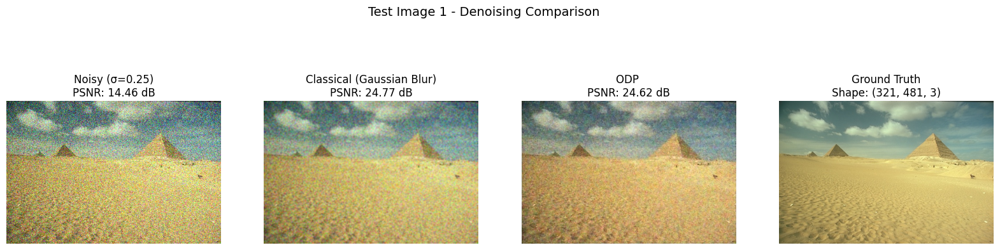

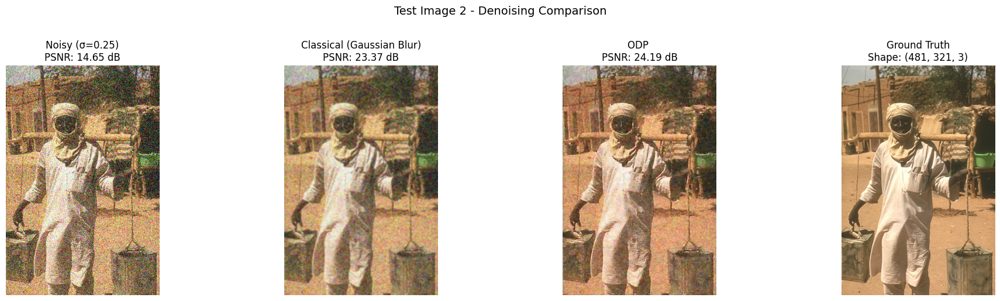

In [84]:
visualize_results(results_noisy, noise_level=0.25, num_images=2)

In [21]:
avg_psnr_noisy = np.mean([r['psnr_noisy'] for r in results_noisy])
avg_psnr_classical = np.mean([r['psnr_classical'] for r in results_noisy])
avg_psnr_odp = np.mean([r['psnr_odp'] for r in results_noisy])

print(f"\nAverage PSNR across {len(results_noisy)} test images:")
print(f"  Noisy:     {avg_psnr_noisy:.2f} dB")
print(f"  Classical: {avg_psnr_classical:.2f} dB (Gaussian blur)")
print(f"  ODP:       {avg_psnr_odp:.2f} dB")
print(f"\nODP improvement over classical: +{avg_psnr_odp - avg_psnr_classical:.2f} dB")


Average PSNR across 15 test images:
  Noisy:     13.19 dB
  Classical: 21.72 dB (Gaussian blur)
  ODP:       22.45 dB

ODP improvement over classical: +0.72 dB


In [22]:
results_noisy_less = evaluate_denoising(odp_model, test_images, noise_level=0.10)
avg_psnr_noisy = np.mean([r['psnr_noisy'] for r in results_noisy_less])
avg_psnr_classical = np.mean([r['psnr_classical'] for r in results_noisy_less])
avg_psnr_odp = np.mean([r['psnr_odp'] for r in results_noisy_less])

print(f"\nAverage PSNR across {len(results_noisy_less)} test images:")
print(f"  Noisy:     {avg_psnr_noisy:.2f} dB")
print(f"  Classical: {avg_psnr_classical:.2f} dB (Gaussian blur)")
print(f"  ODP:       {avg_psnr_odp:.2f} dB")
print(f"\nODP improvement over classical: +{avg_psnr_odp - avg_psnr_classical:.2f} dB")


Evaluating image 1/15 - Shape: (321, 481, 3)
  PSNR Noisy:     20.09 dB
  PSNR Classical: 29.06 dB
  PSNR ODP:       28.41 dB
  Improvement:    +8.32 dB over noisy

Evaluating image 2/15 - Shape: (481, 321, 3)
  PSNR Noisy:     20.16 dB
  PSNR Classical: 26.28 dB
  PSNR ODP:       27.45 dB
  Improvement:    +7.29 dB over noisy

Evaluating image 3/15 - Shape: (481, 321, 3)
  PSNR Noisy:     20.23 dB
  PSNR Classical: 24.54 dB
  PSNR ODP:       26.21 dB
  Improvement:    +5.98 dB over noisy

Evaluating image 4/15 - Shape: (321, 481, 3)
  PSNR Noisy:     20.19 dB
  PSNR Classical: 21.13 dB
  PSNR ODP:       22.59 dB
  Improvement:    +2.40 dB over noisy

Evaluating image 5/15 - Shape: (321, 481, 3)
  PSNR Noisy:     20.27 dB
  PSNR Classical: 26.21 dB
  PSNR ODP:       25.85 dB
  Improvement:    +5.58 dB over noisy

Evaluating image 6/15 - Shape: (321, 481, 3)
  PSNR Noisy:     20.00 dB
  PSNR Classical: 28.81 dB
  PSNR ODP:       28.83 dB
  Improvement:    +8.83 dB over noisy

Evaluatin

In [ ]:
results_smaller_noisy = evaluate_denoising(odp_model, test_images, noise_level=0.05)
results_small_noisy = evaluate_denoising(odp_model, test_images, noise_level=0.10)
results_large_noisy = evaluate_denoising(odp_model, test_images, noise_level=0.20)
results_larger_noisy = evaluate_denoising(odp_model, test_images, noise_level=0.25)


Evaluating image 1/15 - Shape: (321, 481, 3)
  PSNR Noisy:     26.02 dB
  PSNR Classical: 31.64 dB
  PSNR ODP:       29.68 dB
  Improvement:    +3.65 dB over noisy

Evaluating image 2/15 - Shape: (481, 321, 3)
  PSNR Noisy:     26.09 dB
  PSNR Classical: 27.55 dB
  PSNR ODP:       28.49 dB
  Improvement:    +2.40 dB over noisy

Evaluating image 3/15 - Shape: (481, 321, 3)
  PSNR Noisy:     26.10 dB
  PSNR Classical: 25.37 dB
  PSNR ODP:       26.63 dB
  Improvement:    +0.53 dB over noisy

Evaluating image 4/15 - Shape: (321, 481, 3)
  PSNR Noisy:     26.13 dB
  PSNR Classical: 21.50 dB
  PSNR ODP:       23.05 dB
  Improvement:    +-3.08 dB over noisy

Evaluating image 5/15 - Shape: (321, 481, 3)
  PSNR Noisy:     26.07 dB
  PSNR Classical: 27.39 dB
  PSNR ODP:       25.78 dB
  Improvement:    +-0.29 dB over noisy

Evaluating image 6/15 - Shape: (321, 481, 3)
  PSNR Noisy:     26.02 dB
  PSNR Classical: 31.22 dB
  PSNR ODP:       30.14 dB
  Improvement:    +4.11 dB over noisy

Evaluat

In [46]:
#Compare average PSNRs at different noise levels 0.05, 0.1, 0.15, 0.20, 0.25
def compute_average_psnrs(results):
    avg_psnr_noisy = np.mean([r['psnr_noisy'] for r in results])
    avg_psnr_gaussian = np.mean([r['psnr_classical'] for r in results])
    avg_psnr_odp = np.mean([r['psnr_odp'] for r in results])
    return avg_psnr_noisy, avg_psnr_gaussian, avg_psnr_odp

avg_psnr_smaller = compute_average_psnrs(results_smaller_noisy)
avg_psnr_small = compute_average_psnrs(results_small_noisy)
avg_psnr_medium = compute_average_psnrs(results)
avg_psnr_large = compute_average_psnrs(results_large_noisy)
avg_psnr_larger = compute_average_psnrs(results_larger_noisy)

print("\n Average PSNRs at different noise levels : ")
print("Noise Level |   Noisy   | Gaussian  |   ODP  | Improvement ")
print("----------------------------------------------------------------------")
print(f"  0.05     | {avg_psnr_smaller[0]:8.3f} | {avg_psnr_smaller[1]:8.3f} | {avg_psnr_smaller[2]:8.3f} | {avg_psnr_smaller[2]-avg_psnr_smaller[1]:.2f} dB")
print(f"  0.10     | {avg_psnr_small[0]:8.3f} | {avg_psnr_small[1]:8.3f} | {avg_psnr_small[2]:8.3f} | {avg_psnr_small[2]-avg_psnr_small[1]:.2f} dB")
print(f"  0.15     | {avg_psnr_medium[0]:8.3f} | {avg_psnr_medium[1]:8.3f} | {avg_psnr_medium[2]:8.3f} | {avg_psnr_medium[2]-avg_psnr_medium[1]:.2f} dB")
print(f"  0.20     | {avg_psnr_large[0]:8.3f} | {avg_psnr_large[1]:8.3f} | {avg_psnr_large[2]:8.3f} | {avg_psnr_large[2]-avg_psnr_large[1]:.2f} dB")
print(f"  0.25     | {avg_psnr_larger[0]:8.3f} | {avg_psnr_larger[1]:8.3f} | {avg_psnr_larger[2]:8.3f} | {avg_psnr_larger[2]-avg_psnr_larger[1]:.2f} dB")


 Average PSNRs at different noise levels : 
Noise Level |   Noisy   | Gaussian  |   ODP  | Improvement 
----------------------------------------------------------------------
  0.05     |   26.224 |   27.680 |   27.593 | -0.09 dB
  0.10     |   20.357 |   26.184 |   27.064 | 0.88 dB
  0.15     |   17.046 |   24.551 |   25.908 | 1.36 dB
  0.20     |   14.820 |   23.057 |   24.209 | 1.15 dB
  0.25     |   13.188 |   21.725 |   22.434 | 0.71 dB


# Part 2: Motion Deblurring with ODP

## Overview

We solve the motion deblurring inverse problem:

$$y = A(x) + \epsilon$$

where:
- $x$: Sharp original image
- $A$: Motion blur operator (convolution with blur kernel)
- $y$: Observed blurred image
- $\epsilon$: Measurement noise

## Mathematical Framework

**Optimization Problem:**
$$\min_x \frac{1}{2}\|A(x) - y\|_2^2 + R(x)$$

**Proximal Gradient Iteration:**
$$x_{k+1} = x_k - \alpha_k \cdot A^T(A(x_k) - y) - \text{CNN}_k(x_k)$$

where:
- $A^T$: Adjoint of the blur operator (transpose convolution)
- $\text{CNN}_k$: Learned prior at iteration $k$

In [8]:
class MotionBlurOperator:
    """Motion blur operator for GRAYSCALE images."""
    
    def __init__(self, kernel_size=13, angle=45):
        self.kernel_size = kernel_size
        self.angle = angle
        self.kernel = self._create_motion_kernel()
    
    def _create_motion_kernel(self):
        k = self.kernel_size
        kernel = np.zeros((k, k))
        center = k // 2
        angle_rad = np.radians(self.angle)
        
        for i in range(k):
            x = int(center + (i - center) * np.cos(angle_rad))
            y = int(center + (i - center) * np.sin(angle_rad))
            x = np.clip(x, 0, k - 1)
            y = np.clip(y, 0, k - 1)
            kernel[y, x] = 1.0
        
        return kernel / np.sum(kernel)
    
    def forward(self, x):
        """Apply blur to grayscale image."""
        if isinstance(x, torch.Tensor):
            x_np = x.cpu().detach().numpy()
            y_np = np.zeros_like(x_np)
            for b in range(x_np.shape[0]):
                y_np[b, 0] = cv2.filter2D(x_np[b, 0], -1, self.kernel)
            return torch.from_numpy(y_np).to(x.device).float()
        else:
            return cv2.filter2D(x, -1, self.kernel)
    
    def adjoint(self, y):
        """Apply adjoint."""
        kernel_t = self.kernel.T
        if isinstance(y, torch.Tensor):
            y_np = y.cpu().detach().numpy()
            result_np = np.zeros_like(y_np)
            for b in range(y_np.shape[0]):
                result_np[b, 0] = cv2.filter2D(y_np[b, 0], -1, kernel_t)
            return torch.from_numpy(result_np).to(y.device).float()
        else:
            return cv2.filter2D(y, -1, kernel_t)

motion_blur_op = MotionBlurOperator(kernel_size=10, angle=45)
print(f"Motion Blur Operator (Grayscale): kernel={motion_blur_op.kernel_size}, angle={motion_blur_op.angle}°")

Motion Blur Operator (Grayscale): kernel=10, angle=45°


Train: 55 images, shape: (481, 321)
Test: 15 images


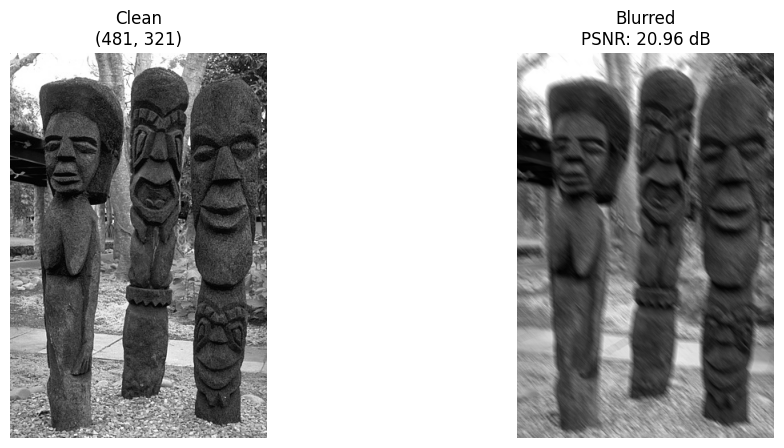

In [10]:
# Helper functions for grayscale
def grayscale_to_tensor(image):
    return torch.from_numpy(image).float().unsqueeze(0).unsqueeze(0)

def tensor_to_grayscale(tensor):
    return np.clip(tensor.squeeze().detach().cpu().numpy(), 0, 1)

# Convert images to grayscale

train_images_gray = [cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0 
                     for img in train_images]
test_images_gray = [cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0 
                    for img in test_images]

print(f"Train: {len(train_images_gray)} images, shape: {train_images_gray[0].shape}")
print(f"Test: {len(test_images_gray)} images")

# Visualize
sample_gray = train_images_gray[0]
sample_blurred = motion_blur_op.forward(sample_gray)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(sample_gray, cmap='gray')
axes[0].set_title(f"Clean\n{sample_gray.shape}")
axes[0].axis('off')
axes[1].imshow(sample_blurred, cmap='gray')
axes[1].set_title(f"Blurred\nPSNR: {compute_psnr(sample_gray, sample_blurred):.2f} dB")
axes[1].axis('off')
plt.show()

In [11]:
class CNNPriorGray(nn.Module):
    """CNN prior for grayscale images (1 channel)."""
    
    def __init__(self, hidden_channels=64, num_layers=10):
        super(CNNPriorGray, self).__init__()
        layers = [nn.Conv2d(1, hidden_channels, 3, padding=1), nn.ReLU()]
        for _ in range(num_layers - 2):
            layers += [nn.Conv2d(hidden_channels, hidden_channels, 3, padding=1), nn.ReLU()]
        layers.append(nn.Conv2d(hidden_channels, 1, 3, padding=1))
        self.network = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.network(x)


class ODPDeblurringGray(nn.Module):
    """ODP for grayscale motion deblurring."""
    
    def __init__(self, blur_operator, num_iterations=5, hidden_channels=64):
        super(ODPDeblurringGray, self).__init__()
        self.blur_op = blur_operator
        self.num_iterations = num_iterations
        self.cnn_priors = nn.ModuleList([
            CNNPriorGray(hidden_channels=hidden_channels) for _ in range(num_iterations)
        ])
        self.alphas = nn.ParameterList([
            nn.Parameter(torch.tensor(0.05)) for _ in range(num_iterations)
        ])
    
    def forward(self, y):
        x = self.blur_op.adjoint(y)
        for k in range(self.num_iterations):
            alpha_k = torch.abs(self.alphas[k])
            Ax = self.blur_op.forward(x)
            gradient = self.blur_op.adjoint(Ax - y)
            z_k = self.cnn_priors[k](x)
            x = x - alpha_k * gradient - z_k
            x = torch.clamp(x, 0, 1)
        return x

odp_deblur_gray = ODPDeblurringGray(motion_blur_op, num_iterations=5, hidden_channels=64).to(device)
print(f"ODP Deblurring : {sum(p.numel() for p in odp_deblur_gray.parameters()):,} parameters")

ODP Deblurring : 1,483,210 parameters


Training: 55 images, 20 epochs
Epoch [1/20] Loss: 0.006818
Epoch [5/20] Loss: 0.004040
Epoch [10/20] Loss: 0.003000
Epoch [15/20] Loss: 0.002721
Epoch [20/20] Loss: 0.002499


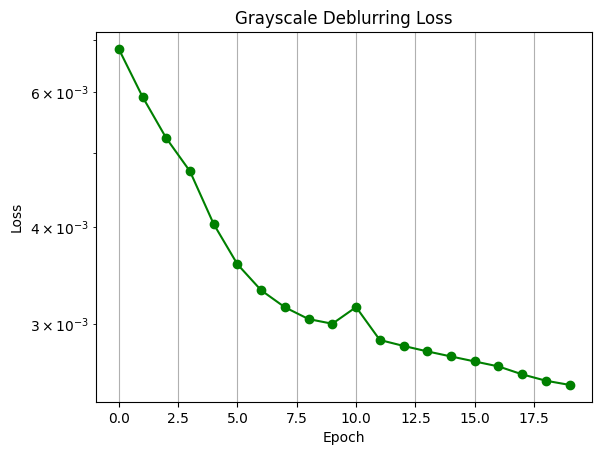

In [12]:
def train_odp_deblur_gray(model, train_images, blur_op, num_epochs=20, noise_level=0.01, lr=1e-4):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    losses = []
    
    print(f"Training: {len(train_images)} images, {num_epochs} epochs")
    
    for epoch in range(num_epochs):
        epoch_loss = 0.0
        for clean in train_images:
            blurred = blur_op.forward(clean)
            blurred_noisy = np.clip(blurred + np.random.randn(*blurred.shape).astype(np.float32) * noise_level, 0, 1)
            
            y = grayscale_to_tensor(blurred_noisy).to(device)
            x_true = grayscale_to_tensor(clean).to(device)
            
            optimizer.zero_grad()
            loss = criterion(model(y), x_true)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        
        losses.append(epoch_loss / len(train_images))
        if (epoch + 1) % 5 == 0 or epoch == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}] Loss: {losses[-1]:.6f}")
    
    return losses

losses_gray = train_odp_deblur_gray(odp_deblur_gray, train_images_gray, motion_blur_op, num_epochs=20)

plt.plot(losses_gray, 'g-o')
plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.title('Grayscale Deblurring Loss')
plt.yscale('log'); plt.grid(True); plt.show()

In [14]:
def evaluate_deblurring_gray(model, test_images, blur_op, noise_level=0.01):
    model.eval()
    results = []
    
    with torch.no_grad():
        for idx, clean in enumerate(test_images):
            blurred = blur_op.forward(clean)
            blurred_noisy = np.clip(blurred + np.random.randn(*blurred.shape).astype(np.float32) * noise_level, 0, 1)
            
            odp_result = tensor_to_grayscale(model(grayscale_to_tensor(blurred_noisy).to(device)))
            
            psnr_blurred = compute_psnr(clean, blurred_noisy)
            psnr_odp = compute_psnr(clean, odp_result)
            
            results.append({'clean': clean, 'blurred_noisy': blurred_noisy, 'odp': odp_result,
                           'psnr_blurred': psnr_blurred, 'psnr_odp': psnr_odp, 'shape': clean.shape})
            print(f"Image {idx+1}: {psnr_blurred:.2f}dB → {psnr_odp:.2f}dB (+{psnr_odp-psnr_blurred:.2f}dB)")
    
    return results

results_gray = evaluate_deblurring_gray(odp_deblur_gray, test_images_gray, motion_blur_op)

Image 1: 29.43dB → 31.58dB (+2.15dB)
Image 2: 22.78dB → 27.32dB (+4.54dB)
Image 3: 21.54dB → 25.91dB (+4.37dB)
Image 4: 19.44dB → 21.86dB (+2.41dB)
Image 5: 24.85dB → 27.52dB (+2.67dB)
Image 6: 29.25dB → 31.28dB (+2.03dB)
Image 7: 26.98dB → 30.28dB (+3.29dB)
Image 8: 29.02dB → 31.38dB (+2.35dB)
Image 9: 25.63dB → 29.06dB (+3.42dB)
Image 10: 23.98dB → 30.46dB (+6.48dB)
Image 11: 21.22dB → 24.57dB (+3.35dB)
Image 12: 22.79dB → 26.26dB (+3.47dB)
Image 13: 24.29dB → 28.51dB (+4.21dB)
Image 14: 20.01dB → 23.19dB (+3.18dB)
Image 15: 23.66dB → 29.03dB (+5.37dB)


In [15]:
#save deblurring model
model_deblur_path = "odp_deblurring_model.pth"
torch.save(odp_deblur_gray.state_dict(), model_deblur_path)

In [25]:
#load deblurring model
model_deblur_path = "odp_deblurring_model.pth"
odp_deblur.load_state_dict(torch.load(model_deblur_path))

<All keys matched successfully>

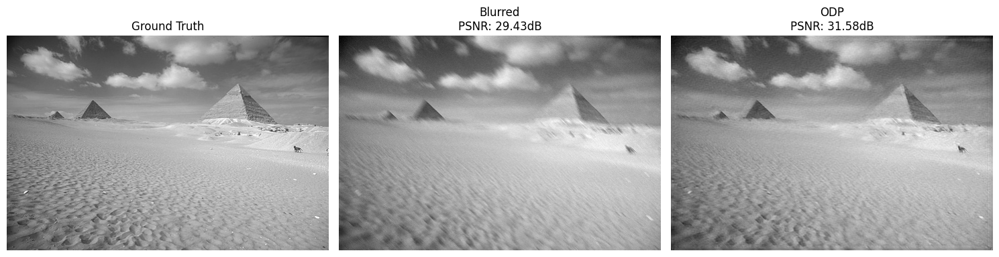

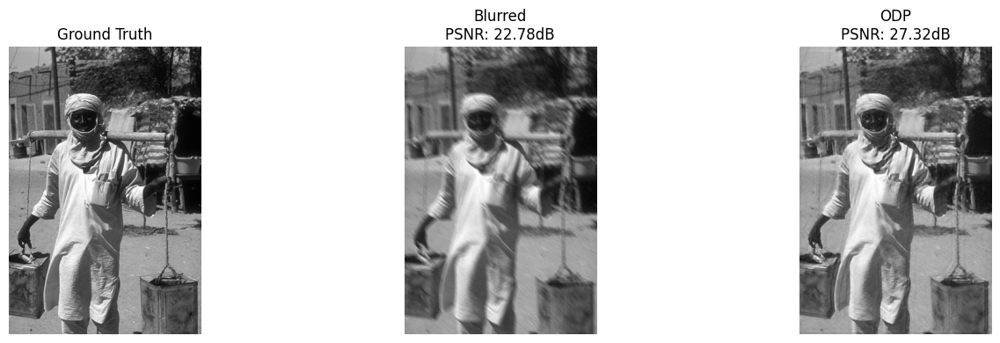

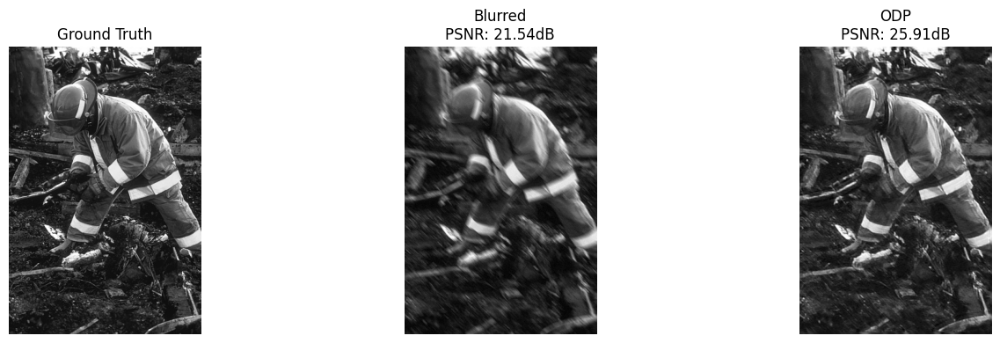

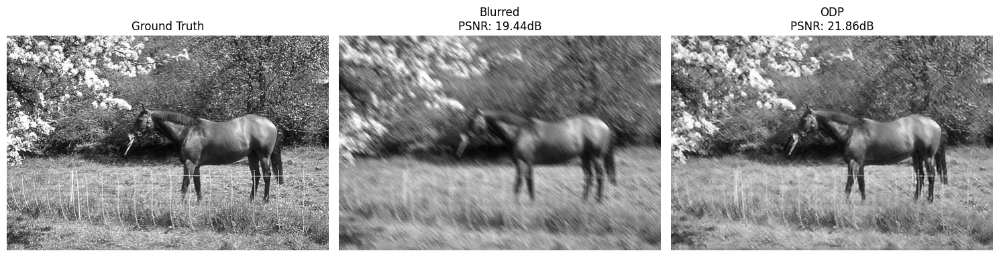

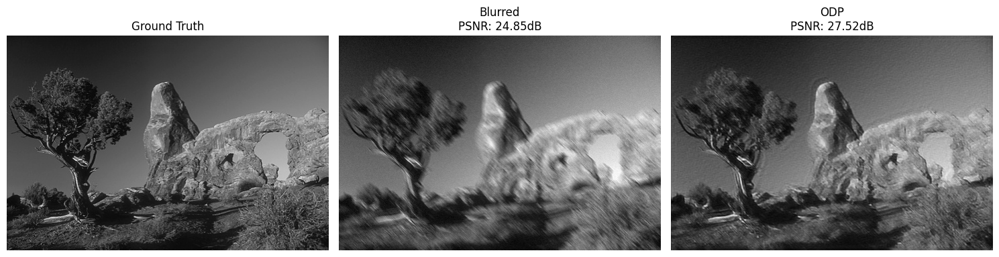


Average: Blurred=24.33dB, ODP=27.88dB, Improvement=+3.55dB


In [17]:
for idx, r in enumerate(results_gray[:5]):
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    axes[0].imshow(r['clean'], cmap='gray'); axes[0].set_title(f"Ground Truth"); axes[0].axis('off')
    axes[1].imshow(r['blurred_noisy'], cmap='gray'); axes[1].set_title(f"Blurred\nPSNR: {r['psnr_blurred']:.2f}dB"); axes[1].axis('off')
    axes[2].imshow(r['odp'], cmap='gray'); axes[2].set_title(f"ODP\nPSNR: {r['psnr_odp']:.2f}dB"); axes[2].axis('off')
    plt.tight_layout(); plt.show()

avg_blurred = np.mean([r['psnr_blurred'] for r in results_gray])
avg_odp = np.mean([r['psnr_odp'] for r in results_gray])
print(f"\nAverage: Blurred={avg_blurred:.2f}dB, ODP={avg_odp:.2f}dB, Improvement=+{avg_odp-avg_blurred:.2f}dB")